In [30]:
import opendatasets as od
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_samples, silhouette_score
from matplotlib import cm
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.manifold import TSNE


In [2]:
# Load first dataset (Make sure to gitignore if running and pulling)
# od.download(
# 	"https://www.kaggle.com/datasets/thedevastator/predicting-credit-card-customer-attrition-with-m")

In [3]:
# Load second dataset (Make sure to gitignore if running and pulling)
# od.download(
# 	"https://www.kaggle.com/datasets/alifarahmandfar/customer-segmentation")

In [4]:
file =('./predicting-credit-card-customer-attrition-with-m/BankChurners.csv')
df_1 = pd.read_csv(file)

In [5]:
file = ('./customer-segmentation/Customer_Data.csv')
df_2 = pd.read_csv(file)

In [6]:
# Start w/ dataset 2
df_2.head(5)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [7]:
df_2.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


This dataset has solely numerical type. In this case, methods that use only numerical data were used. Examples for mixed types can be found here https://bpostance.github.io/posts/clustering-mixed-data/

Data pipelines should include multiple data imputation techniques and test multiple clustering methods.

Pipeline should look like this:

1. Clean
2. Impute
3. Dimensionality reduction
4. Clustering

In [8]:
# Print cardinality of each column
for col in df_2.columns:
    print(col, df_2[col].nunique())

CUST_ID 8950
BALANCE 8871
BALANCE_FREQUENCY 43
PURCHASES 6203
ONEOFF_PURCHASES 4014
INSTALLMENTS_PURCHASES 4452
CASH_ADVANCE 4323
PURCHASES_FREQUENCY 47
ONEOFF_PURCHASES_FREQUENCY 47
PURCHASES_INSTALLMENTS_FREQUENCY 47
CASH_ADVANCE_FREQUENCY 54
CASH_ADVANCE_TRX 65
PURCHASES_TRX 173
CREDIT_LIMIT 205
PAYMENTS 8711
MINIMUM_PAYMENTS 8636
PRC_FULL_PAYMENT 47
TENURE 7


In [9]:
# Drop CUST_ID column
df_2=df_2.drop(['CUST_ID'], axis=1)
features = df_2.columns

In [10]:
# Impute missing values
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
df_2 = imp.fit_transform(df_2)

In [11]:
# Scale data
scaler = StandardScaler()
df_2 = scaler.fit_transform(df_2)

In [12]:
pd.DataFrame(df_2, columns=features).describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03
mean,-2.540488e-17,1.587805e-16,3.175610e-18,-6.033659e-17,3.175610e-17,-6.351220e-18,9.328354e-17,1.905366e-17,5.716098e-17,-1.595744e-16,-1.746585e-17,-1.905366e-17,2.032390e-16,-2.540488e-17,2.699268e-17,-9.526830e-18,2.921561e-16
std,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00
min,-7.516398e-01,-3.703271e+00,-4.695519e-01,-3.569340e-01,-4.545762e-01,-4.667856e-01,-1.221758e+00,-6.786608e-01,-9.169952e-01,-6.753489e-01,-4.760698e-01,-5.917959e-01,-1.221536e+00,-5.986883e-01,-3.708230e-01,-5.255510e-01,-4.122768e+00
25%,-6.900078e-01,4.904486e-02,-4.510006e-01,-3.569340e-01,-4.545762e-01,-4.667856e-01,-1.014125e+00,-6.786608e-01,-9.169952e-01,-6.753489e-01,-4.760698e-01,-5.515646e-01,-7.955261e-01,-4.662913e-01,-2.975162e-01,-5.255510e-01,3.606795e-01
50%,-3.320286e-01,5.180838e-01,-3.004541e-01,-3.340396e-01,-3.561562e-01,-4.667856e-01,2.404259e-02,-3.993193e-01,-4.976286e-01,-6.753489e-01,-4.760698e-01,-3.101767e-01,-4.107426e-01,-3.026846e-01,-2.268130e-01,-5.255510e-01,3.606795e-01
75%,2.352559e-01,5.180838e-01,5.004652e-02,-9.056763e-03,6.366321e-02,6.435242e-02,1.062211e+00,3.269728e-01,9.701506e-01,4.351492e-01,1.100739e-01,9.213645e-02,5.512163e-01,5.802976e-02,4.878305e-17,-3.712234e-02,3.606795e-01
max,8.397489e+00,5.180838e-01,2.248351e+01,2.420107e+01,2.442689e+01,2.201112e+01,1.269843e+00,2.673451e+00,1.599199e+00,6.820521e+00,1.754785e+01,1.381101e+01,7.010083e+00,1.692228e+01,3.241509e+01,2.893453e+00,3.606795e-01


In [13]:
# Simple Kmeans clustering
km = KMeans(n_clusters=5)
y_km = km.fit_predict(df_2)

/home/codespace/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


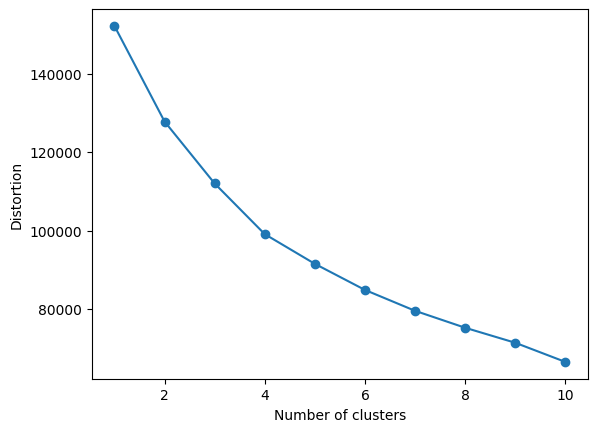

In [14]:
# Elbow method with simple Kmeans clustering
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(df_2)
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

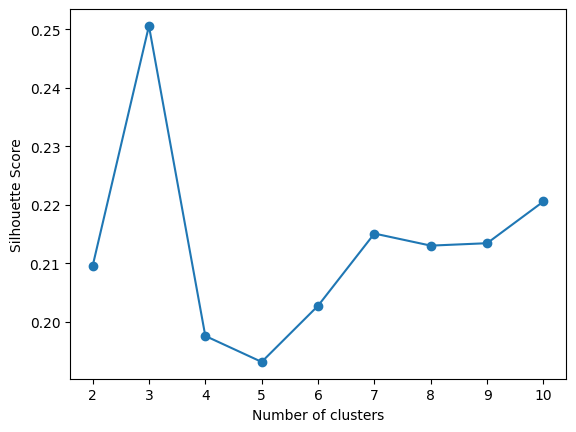

In [15]:
# Silhouette Score Method

silhouette_scores = []
for i in range(2, 11):
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(df_2)
    silhouette_scores.append(silhouette_score(df_2, km.labels_))

# plot
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [28]:
np.unique(km.labels_)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int32)

In [29]:
# DBSCAN
db = DBSCAN()
y_db = db.fit_predict(df_2)

In [17]:
db.components_.shape

(1828, 17)

In [18]:
# Perform PCA
pca = PCA(n_components=5)
pca.fit(df_2)

PCA(n_components=5)

In [19]:
#Visualize PCA
projected = pca.transform(df_2)
fig = px.scatter_matrix(
    projected
)
# fig.update_traces(diagonal_visible=False)
fig.show()

In [32]:
# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=50, learning_rate=100)
tsne.fit(df_2)

TSNE(learning_rate=100, perplexity=50)

In [34]:
#Visualize t-SNE
projected = tsne.fit_transform(df_2)
fig = px.scatter_matrix(
    projected
)
# fig.update_traces(diagonal_visible=False)
fig.show()

/home/codespace/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/codespace/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/codespace/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


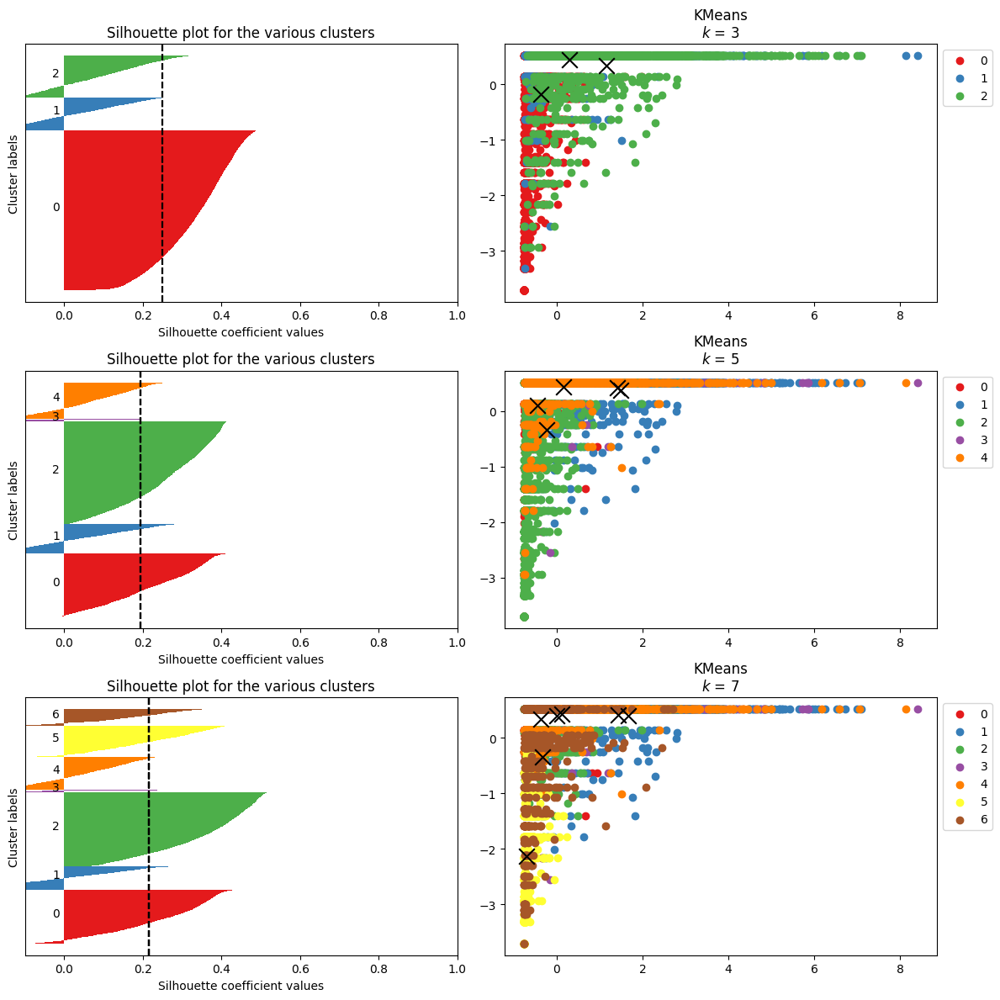

In [17]:
# borrowed code from https://bpostance.github.io/posts/clustering-mixed-data/

# k_cand = [3,5,7]

# fig,axs = plt.subplots(len(k_cand),2,figsize=(12,12))

# for e,k in enumerate(k_cand):
#     kmeans = KMeans(n_clusters=k, random_state=0).fit(df_2)
    
#     cdict = {i:cm.Set1(i) for i in np.unique(kmeans.labels_)}
    
#     ## silhouette samples
#     silhouette_vals = silhouette_samples(df_2,kmeans.labels_)
#     y_lower = 0 
#     y_upper = 0
#     for i,cluster in enumerate(np.unique(kmeans.labels_)):
#         cluster_silhouette_vals = silhouette_vals[kmeans.labels_==cluster]
#         cluster_silhouette_vals.sort()
#         y_upper += len(cluster_silhouette_vals)
#         axs[e,0].barh(range(y_lower,y_upper),
#                       cluster_silhouette_vals,
#                       height=1,
#                       color=cdict[cluster])
#         axs[e,0].text(-0.03,(y_lower+y_upper)/2,str(i))
        
#         y_lower += len(cluster_silhouette_vals) # add for next iteration 
#         avg_score = np.mean(silhouette_vals)
#         axs[e,0].axvline(avg_score,linestyle ='--',color = 'black')
        
#         axs[e,0].set_yticks([])
#         axs[e,0].set_xlim([-0.1, 1])
#         axs[e,0].set_xlabel('Silhouette coefficient values')
#         axs[e,0].set_ylabel('Cluster labels')
#         axs[e,0].set_title('Silhouette plot for the various clusters')
        
#     ## plot data and cluster centroids
#     results = pd.DataFrame(df_2)
#     results['k'] = kmeans.labels_
#     for cluster in np.unique(kmeans.labels_): # plot data by cluster
#         axs[e,1].scatter(x=results.where(results['k']==cluster)[0],
#                          y=results.where(results['k']==cluster)[1],
#                          color=cdict[cluster],
#                          label=cluster)
#     # plot centroids
#     axs[e,1].scatter(x=kmeans.cluster_centers_[:,0],
#                      y=kmeans.cluster_centers_[:,1],
#                      marker='x',color='black',s=180)
#     axs[e,1].legend(bbox_to_anchor=(1,1))
#     axs[e,1].set_title(f"KMeans\n$k$ = {k}")
#     plt.tight_layout()